# Metodología de Control de Calidad e Imputación de Datos de Series de Precipitación In Situ

## Objetivo
Esta metodología tiene como finalidad establecer un proceso robusto para la imputación de datos de precipitación in situ, utilizando técnicas modernas de Big Data y Machine Learning, complementadas con datos satelitales y bases de datos climáticas globales (como CHIRPS, ERA5, entre otras).

## 1. Preprocesamiento y Estandarización de Datos
Antes de aplicar cualquier proceso de control de calidad o imputación, es fundamental garantizar la correcta estructuración de los datos brutos o primarios.

## 2. Estructura de Control de Calidad
A partir de la serie estandarizada, se genera una estructura de control de calidad que enriquece la serie con metadatos asociados al resultado de las pruebas de calidad:

Se procede a realizar la solicitud de la serie con control de calidad a la API de CCCP:


In [1]:
from api_somo import APIClient, fetch_qf 
import logging
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Configuración del logger
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

api_url = "http://127.0.0.1:8000/database/functions/time-series/filter_date_serie/"
params = {
    "station_name": "gorgona",
    "variable_name": "Precipitación acumulada",
    "processing_level_name": "Control de calidad",
    "start_date": "2009-01-01",
    "end_date": "2023-12-31"
}

try:
    # 1. Solicitar y procesar los datos
    red_mpomm_serie, red_mpomm_metadata = APIClient.fetch_and_process_data(api_url, params)

    # Asegurar que el índice es datetime
    if not pd.api.types.is_datetime64_any_dtype(red_mpomm_serie.index):
        red_mpomm_serie.index = pd.to_datetime(red_mpomm_serie.index)

    if red_mpomm_serie.empty:
        raise ValueError("La serie histórica está vacía.")

    #logger.info(f"Serie histórica descargada correctamente. Columnas: {red_mpomm_serie.columns.tolist()}")

except Exception as e:
    logger.error(f"Error al obtener la serie histórica: {e}")
    red_mpomm_serie = pd.DataFrame()  # para evitar errores en siguientes pasos
    
red_mpomm_serie


INFO:api_somo:Sending request to http://127.0.0.1:8000/database/functions/time-series/filter_date_serie/ with parameters: {'station_name': 'gorgona', 'variable_name': 'Precipitación acumulada', 'processing_level_name': 'Control de calidad', 'start_date': '2009-01-01', 'end_date': '2023-12-31'}
INFO:api_somo:Original columns: ['date_time', 'sensor_data', 'quality_flag']
INFO:api_somo:Timestamp conversion and indexing complete.


,value,qf
timestamp,,
2011-03-18 05:10:00,-99999.0,9
2011-03-18 05:20:00,-99999.0,9
2011-03-18 05:30:00,-99999.0,9
2011-03-18 05:40:00,-99999.0,9
2011-03-18 05:50:00,-99999.0,9
...,...,...
2022-03-05 04:20:00,0.0,1
2022-03-05 04:30:00,0.0,1
2022-03-05 04:40:00,0.0,1


- **qf (Quality Flag)**: código numérico que indica el resultado de una o varias pruebas de calidad.


> ⚠️ La preservación de los datos originales es una prioridad. Las modificaciones solo deben aplicarse cuando la prueba indique una necesidad clara y bien justificada.

## 3. Pruebas de Control de Calidad
### 3.1. Consistencia Temporal
Una serie temporal debe tener frecuencia de muestreo constante. Esto significa que cada paso de tiempo entre observaciones debe ser homogéneo (e.g., diaria, horaria).

Proceso:
- Se analiza la frecuencia de muestreo mediante pandas.infer_freq o análisis de diferencias del índice.

- Si se detectan huecos en la serie (días u horas faltantes), se reindexa la serie para completar la malla temporal esperada.

    `df = df.asfreq('D')  # ejemplo para series diarias`
- A los puntos sin datos se les asigna un valor por defecto de -99999, conforme a estándares internacionales como los del IODE (International Oceanographic Data and Information Exchange).
    `df['value'].fillna(-99999, inplace=True)`

### 3.2. Otras Pruebas Básicas
- Rango Físico Aceptable: verifica que los valores estén dentro del rango físico o esperable (e.g., precipitación no puede ser negativa).

- Detección de valores extremos/anómalos: puede utilizarse el IQR, desviaciones estándar, o algoritmos robustos como Isolation Forest.

- Duplicados temporales: detección y resolución de registros con el mismo timestamp.

- Coherencia contextual: análisis de coherencia con estaciones vecinas o datos satelitales.

## 4. Imputación de Datos Faltantes
Una vez aplicada la batería de pruebas de calidad y etiquetados los valores anómalos o faltantes, se procede con la imputación de datos.


- Despues de aplicadas estas pruebas se procede a realizar el **filtrado** por bandera de calidad, en este caso tomaremos los datos **buenos(1)** y **sospechosos(3)**, ademas se elimina la casilla de la calidad.

In [2]:

# --- PROCESAMIENTO: FILTRAR CALIDAD ---
if not red_mpomm_serie.empty:
    # QF: Solo valores con calidad 1 o 3 son aceptados
    red_mpomm_serie.loc[~red_mpomm_serie['qf'].isin([1, 3])] = np.nan
    red_mpomm_serie = red_mpomm_serie.drop(columns='qf')

    # Reporte de NaNs
    print('Reporte de datos NaN por columna:')
    print(red_mpomm_serie.isnull().sum())

    # Mostrar primeras filas
    #red_mpomm_serie

Reporte de datos NaN por columna:
value    215938
dtype: int64


## Prerocesamiento serie redmpomm

En esta etapa se realiza un remuestreo de la serie a 3h ya que las series de apoyo que se utilizaran para el desarrollo de esta metodologia tienen una resolucion maxima de 3h, para esto tomamos una condicion en nustre serie la cual para ser sonsiderado el balor remuestreado debe contener mas del **80%** de los datos buenos, en el caso contrario dejara este espacio como un NaN
 

Reporte de datos NaN y/o null en la serie actual: 
value    12327
dtype: int64 



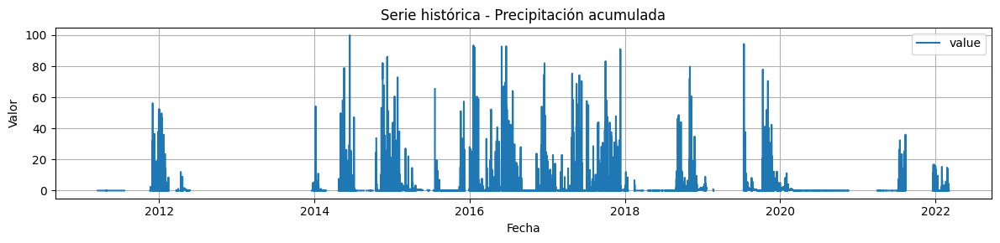

In [3]:
# Remuestreo condicional

# Función para eliminar grupos con más de un porcentaje de NaN
def custom_resample(group, nan_threshold=0.2):
    nan_ratio = group.isna().sum() / len(group)
    return group.sum() if nan_ratio < nan_threshold else np.nan

# Resampleo con diferentes períodos de agregación
red_mpomm_serie_3h = red_mpomm_serie.resample('3h').apply(lambda g: custom_resample(g, nan_threshold=0.2))
print('Reporte de datos NaN y/o null en la serie actual: ')
print(red_mpomm_serie_3h.isnull().sum(),'\n')

lower_bound = 0
upper_bound = 100
# Reemplazar outliers con NaN
red_mpomm_serie_3h['value'] = red_mpomm_serie_3h['value'].where((red_mpomm_serie_3h['value'] >= lower_bound) & (red_mpomm_serie_3h['value'] <= upper_bound), np.nan)

# --- GRAFICAR ---
plt.figure(figsize=(12, 3))
plt.plot(red_mpomm_serie_3h, label=red_mpomm_serie_3h.columns[0])
plt.xlabel('Fecha')
plt.ylabel('Valor')
plt.title('Serie histórica - Precipitación acumulada')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


### 4.1. Fuentes de Información para la Imputación
- Estaciones vecinas (in situ).



- Datos globales (MSWEP).
    
    Se realiza la obtencion de la matriz de datos de la base de datos global y se maneja los datos ausentes


In [ ]:
import pandas as pd

# Cargar el CSV y parsear la columna de fecha como datetime
msweb_serie = pd.read_csv(
    r"E:\074-Diego Rengifo 2025\datasience\precipitacion\db\MSWEP-GloH2O\csv-3h\precipitacion igo radius(2.962, -78.173).csv",
    parse_dates=['dates'],   # reemplaza 'datetime' con el nombre real de tu columna de fecha
    index_col='dates'        # establecer la columna como índice
)


# --- Preprocesamiento: Agregacion temporal ---
if not msweb_serie.empty:
    msweb_serie.index= pd.to_datetime(msweb_serie.index)

    # Paso 2: Crear una serie con índice completo con frecuencia cada 3 horas
    start = msweb_serie.index.min()
    end = msweb_serie.index.max()
    full_index = pd.date_range(start=start, end=end, freq='3h')

    # Paso 3: Reindexar para insertar NaN donde faltan datos
    msweb_serie_with_nans = msweb_serie.reindex(full_index)
    
    # --- GRAFICAR ---
    plt.figure(figsize=(12, 3))
    plt.plot(msweb_serie_with_nans, label=msweb_serie.columns[0])
    plt.xlabel('Fecha')
    plt.ylabel('Valor')
    plt.title('Serie histórica - Precipitación acumulada')
    plt.grid(True)
    #plt.legend()
    plt.tight_layout()
    plt.show()

    # Reporte de NaNs
print('Reporte de datos NaN por columna:')
print(msweb_serie_with_nans.isnull().sum())
msweb_serie_with_nans



FileNotFoundError: [Errno 2] No such file or directory: 'E:\\074-Diego Rengifo 2025\\datasience\\precipitacion\\db\\MSWEP-GloH2O\\csv-3h\\precipitacion igo radius(1.82011, -78.72871).csv'


- Reanálisis climáticos (e.g., ERA5).

- Modelos estadísticos o de machine learning.


# Dataset

Para trabajar de manera adecuada con los datos se realiza la union de la informacion en un dataset, en este añadimos datos de la redmpomm y de la base de datos global, en las marcas de tiempo que coincidan, con el fin de unificar y procesar los datos minimizando errores.


In [5]:
# Asegurarse de que el índice de todos los DataFrames sea datetime sin zona horaria
msweb_serie.index = pd.to_datetime(msweb_serie.index).tz_localize(None)
red_mpomm_serie_3h.index = pd.to_datetime(red_mpomm_serie_3h.index).tz_localize(None)

# Convertir la serie objetivo en DataFrame si no lo es
serie_red = red_mpomm_serie_3h[['value']].copy()

# Renombrar columnas de msweb_serie con un prefijo claro
msweb_renamed = msweb_serie.copy()
msweb_renamed.columns = [f'precipitation_{i+1}' for i in range(len(msweb_serie.columns))]

# Unir todo en un solo DataFrame usando concat (más eficiente que múltiples joins)
dataset = pd.concat([serie_red, msweb_renamed], axis=1)

# Reporte de NaNs
print('Reporte de datos NaN por columna:')
print(dataset.isnull().sum())

# Mostrar primeras filas
dataset.shape


Reporte de datos NaN por columna:
value                 5606
precipitation_1      20783
precipitation_2      20783
precipitation_3      20783
precipitation_4      20783
                     ...  
precipitation_896    20783
precipitation_897    20783
precipitation_898    20783
precipitation_899    20783
precipitation_900    20783
Length: 901, dtype: int64


(44413, 901)

En esta etapa se realiza un filtrado para obtener el subconjunto en donde existan datos en todas las columnas ya cada fuente de datos tiene una fecha de inicio y fin independiente.

In [6]:
# Filtrar todas las columnas de precipitación (excluyendo la serie objetivo)
precip_cols = [col for col in dataset.columns if col.startswith('precipitation_')]

# Encontrar el primer índice donde al menos una columna de precipitación tiene un valor no nulo
non_null_mask = dataset[precip_cols].notnull().any(axis=1)
start_index = dataset[non_null_mask].index.min()
end_index = dataset.iloc[:, 0].last_valid_index()

# Filtrar el DataFrame desde ese índice en adelante
filtered_dataset = dataset.loc[start_index:end_index]

# Verificar resultado
print(f"Primer dato válido en al menos una columna de precipitación: {start_index}")
filtered_dataset.shape


Primer dato válido en al menos una columna de precipitación: 2015-01-01 00:00:00


(23378, 901)

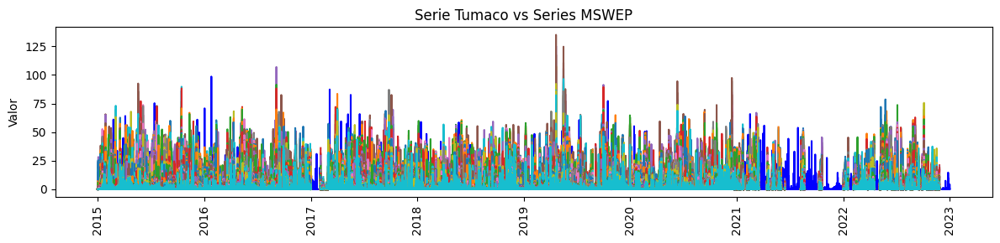

In [7]:
import matplotlib.pyplot as plt


# Crear la figura y el eje
fig, ax = plt.subplots(figsize=(12, 3), sharex=True)

# Graficar la serie objetivo
ax.plot(filtered_dataset.index, filtered_dataset['value'], label="Tumaco", color="blue")

# Graficar todas las columnas de precipitación con colores automáticos
for col in precip_cols:
    ax.plot(filtered_dataset.index, filtered_dataset[col], label=col)

# Configurar título y etiquetas
ax.set_title('Serie Tumaco vs Series MSWEP')
ax.set_ylabel('Valor')
#ax.legend(loc='upper left')

# Ajustar diseño y mostrar
plt.xticks(rotation='vertical')
plt.tight_layout()
plt.show()


In [8]:
filtered_dataset.describe()

,value,precipitation_1,precipitation_2,precipitation_3,precipitation_4,precipitation_5,precipitation_6,precipitation_7,precipitation_8,precipitation_9,...,precipitation_891,precipitation_892,precipitation_893,precipitation_894,precipitation_895,precipitation_896,precipitation_897,precipitation_898,precipitation_899,precipitation_900
count,22514.000000,19874.000000,19874.000000,19874.000000,19874.000000,19874.000000,19874.000000,19874.000000,19874.000000,19874.000000,...,19874.000000,19874.000000,19874.000000,19874.000000,19874.000000,19874.000000,19874.000000,19874.000000,19874.000000,19874.000000
mean,0.810651,0.833847,0.876252,0.874318,0.958533,0.991333,1.033761,1.175019,1.183846,1.286069,...,0.284626,0.301996,0.301755,0.391115,0.454816,0.480084,0.641888,0.814642,0.950683,1.041543
std,3.947242,2.128434,2.222971,2.193745,2.414138,2.539463,2.605222,2.896215,3.015487,3.252336,...,0.741679,0.758889,0.759822,1.024552,1.176819,1.269786,1.661259,2.084584,2.434646,2.559066
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.002047,0.023236,0.024952,0.062500,0.062500,0.062500,0.062500,0.062500,0.062500,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.187500,0.187500,0.187500,0.250000,0.250000,0.250000,0.286163,0.257016,0.312500,...,0.056191,0.062500,0.062500,0.062500,0.062500,0.062500,0.098505,0.125000,0.125000,0.187500
75%,0.000000,0.716718,0.750000,0.750000,0.823516,0.874534,0.875000,1.062500,1.057458,1.125000,...,0.210342,0.250000,0.250000,0.312500,0.375000,0.375000,0.500000,0.687500,0.812500,0.937500
max,98.600000,53.250000,59.500000,58.812500,55.125000,47.271719,49.437500,58.875000,69.802329,52.937500,...,16.625000,13.687500,13.312500,29.187500,30.437500,31.562500,36.125000,44.937500,59.625000,46.500000


---


### 4.2. Modelos y Técnicas para Series Temporales: Regresión e Imputación de Datos Faltantes


**Preparacion de datos**

In [9]:
precipNotNan = filtered_dataset.dropna()
print('Reporte de datos NaN por columna:')
print(precipNotNan.isnull().sum())
precipNotNan


Reporte de datos NaN por columna:
value                0
precipitation_1      0
precipitation_2      0
precipitation_3      0
precipitation_4      0
                    ..
precipitation_896    0
precipitation_897    0
precipitation_898    0
precipitation_899    0
precipitation_900    0
Length: 901, dtype: int64


,value,precipitation_1,precipitation_2,precipitation_3,precipitation_4,precipitation_5,precipitation_6,precipitation_7,precipitation_8,precipitation_9,...,precipitation_891,precipitation_892,precipitation_893,precipitation_894,precipitation_895,precipitation_896,precipitation_897,precipitation_898,precipitation_899,precipitation_900
2015-01-01 00:00:00,0.0,1.000000,0.812500,0.437500,0.187500,0.187500,0.187500,0.187500,0.187500,0.187500,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2015-01-01 03:00:00,0.0,0.375000,0.437500,0.250000,0.687500,1.062500,1.250000,1.500000,1.062500,0.812500,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2015-01-01 06:00:00,0.0,0.250000,0.250000,0.687500,1.250000,1.250000,0.437500,0.750000,0.687500,0.687500,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2015-01-01 09:00:00,0.2,0.312500,0.062500,0.062500,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2015-01-01 12:00:00,4.7,0.750000,0.812500,0.812500,0.750000,0.750000,0.812500,0.875000,0.875000,0.812500,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-25 21:00:00,0.0,0.016920,0.019007,0.018900,0.004469,0.004481,0.004517,0.005109,0.005087,0.005311,...,0.877691,0.628830,0.658874,0.359342,0.377194,0.391607,1.704796,1.599883,1.293427,1.042268
2022-11-26 03:00:00,0.0,0.019662,0.006580,0.006565,0.005897,0.005918,0.005970,0.015982,0.015835,0.001091,...,0.028799,0.010813,0.010427,0.041395,0.042516,0.041961,0.357609,0.534274,1.884164,2.227339
2022-11-26 09:00:00,0.0,0.032139,0.042243,0.041898,0.044485,0.044827,0.045546,0.025540,0.025246,0.014256,...,0.000124,0.012263,0.011733,0.004432,0.004453,0.003689,0.025378,0.455014,1.187049,2.127779
2022-11-26 12:00:00,0.0,0.016002,0.041127,0.040814,0.084969,0.085854,0.087840,0.143279,0.143912,0.139176,...,0.002799,0.009658,0.008918,0.061106,0.063191,0.058619,0.132769,0.183601,0.009851,0.005330



📅 Primeras fechas train: 2015-01-01 00:00:00
📅 Últimas fechas train: 2020-08-23 06:00:00
📅 Primeras fechas test: 2020-08-23 09:00:00
📅 Últimas fechas test: 2022-11-29 21:00:00


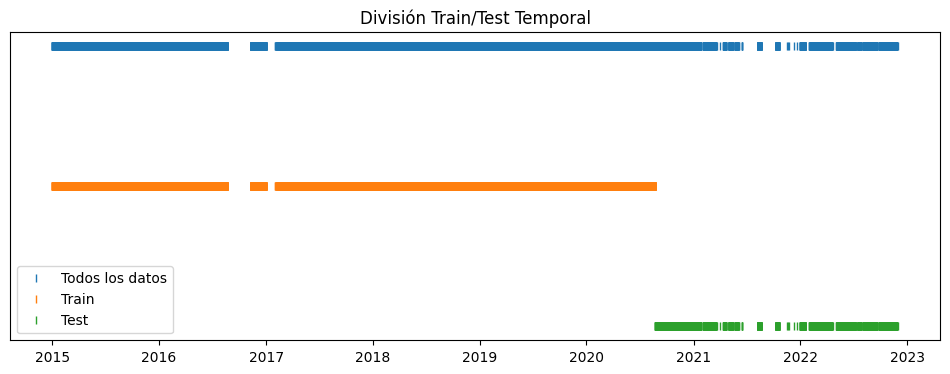

In [10]:
# 1. Verificar y ordenar el índice datetime (si no está ordenado)
precipNotNan = precipNotNan.sort_index()  # Ordena por datetime ascendente

# 2. Dividir conservando el orden temporal
split_idx = int(len(precipNotNan) * 0.8)  # 80% train, 20% test

xTrain = precipNotNan.iloc[:split_idx].drop(columns=['value'])
yTrain = precipNotNan.iloc[:split_idx]['value'].values.flatten()

xTest = precipNotNan.iloc[split_idx:].drop(columns=['value'])
yTest = precipNotNan.iloc[split_idx:]['value'].values.flatten()

# 3. Verificación visual del orden
print("\n📅 Primeras fechas train:", xTrain.index.min())
print("📅 Últimas fechas train:", xTrain.index.max())
print("📅 Primeras fechas test:", xTest.index.min())
print("📅 Últimas fechas test:", xTest.index.max())

# 4. Gráfico de distribución temporal
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 4))
plt.plot(precipNotNan.index, [1]*len(precipNotNan), '|', label='Todos los datos')
plt.plot(xTrain.index, [0.9]*len(xTrain), '|', label='Train')
plt.plot(xTest.index, [0.8]*len(xTest), '|', label='Test')
plt.yticks([])
plt.title("División Train/Test Temporal")
plt.legend()
plt.show()

#### 📌4.2.1 Modelos Clásicos de Series Temporales

Para regresión/predicción univariante:

- **ARIMA** (AutoRegressive Integrated Moving Average)


e:\074-Diego Rengifo 2025\datasience\precipitacion\bigdata\bigdata\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 3h will be used.
  self._init_dates(dates, freq)
e:\074-Diego Rengifo 2025\datasience\precipitacion\bigdata\bigdata\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 3h will be used.
  self._init_dates(dates, freq)


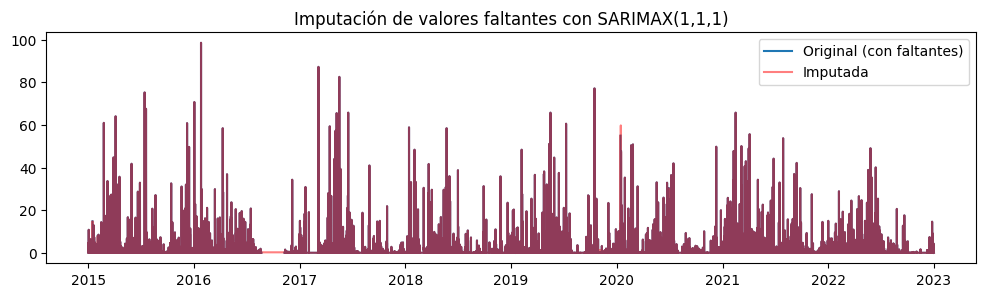

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Copia de la serie original con valores faltantes
serie_original = filtered_dataset['value'].copy()

# Ajustar modelo SARIMAX (equivalente a ARIMA(1,1,1))
model = SARIMAX(serie_original, order=(1, 1, 1), seasonal_order=(0, 0, 0, 0))
model_fit = model.fit(disp=False)  # `disp=False` para evitar mensajes de optimización

# Obtener predicciones in-sample (incluye imputaciones de NaN)
predicciones = model_fit.predict(start=0, end=len(serie_original)-1)

# Imputar solo los valores faltantes usando las predicciones
serie_imputada = serie_original.copy()
serie_imputada[serie_original.isna()] = predicciones[serie_original.isna()]

# Graficar resultados
plt.figure(figsize=(12, 3))
plt.plot(serie_original, label='Original (con faltantes)')
plt.plot(serie_imputada, label='Imputada', color='red', alpha=0.5)
plt.legend()
plt.title('Imputación de valores faltantes con SARIMAX(1,1,1)')
plt.show()

- **SARIMA** (Seasonal ARIMA)

In [12]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
model = SARIMAX(precipNotNan['value'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))  # 12 meses

e:\074-Diego Rengifo 2025\datasience\precipitacion\bigdata\bigdata\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
e:\074-Diego Rengifo 2025\datasience\precipitacion\bigdata\bigdata\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


- **Exponential Smoothing**

In [13]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
model = ExponentialSmoothing(precipNotNan['value'], trend='add', seasonal='add', seasonal_periods=12).fit()

e:\074-Diego Rengifo 2025\datasience\precipitacion\bigdata\bigdata\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


#### 📌 4.2.2 Modelos Avanzados de Machine Learning

- **Perceptron**


In [14]:
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
import pandas as pd

# Definir grilla de hiperparámetros para el modelo MLP
param_grid = {
    'mlp__hidden_layer_sizes': [ (150, 100, 50, 50), (150, 100, 50, 50, 50, 50)],  # Redes más simples
    'mlp__alpha': [0.001, 0.0001, 0.00001],  # Mayor regularización
    'mlp__activation': ['relu'],  # tanh funciona mejor en series
    'mlp__learning_rate': ['adaptive'],  # Tasa de aprendizaje adaptable
    'mlp__solver': ['adam'],  # Solo Adam para estabilidad
    'mlp__batch_size': ['auto']  # Mini-batches para series
}

# Validación cruzada k-fold
cv = TimeSeriesSplit(n_splits=5)

pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Se ajusta SOLO con datos de train en cada fold
    ('mlp', MLPRegressor(max_iter=5000, random_state=42))
])

# Búsqueda de hiperparámetros
grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    scoring='r2',
    cv=cv,  # ¡Usa TimeSeriesSplit aquí!
    n_jobs=1,  # Para series, evita paralelismo (puede causar leaks)
    verbose=2
)

# Asegúrate de que xTrain esté ORDENADO POR TIEMPO
grid_search.fit(xTrain, yTrain)

# Mostrar los mejores hiperparámetros
print("\n✅ Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mostrar mejor score de validación
print(f"\n🔍 Mejor score R² en validación cruzada: {grid_search.best_score_:.4f}")

# Mostrar tabla ordenada de resultados
results = pd.DataFrame(grid_search.cv_results_)
top = results.sort_values(by='mean_test_score', ascending=False)
print("\n📊 Top combinaciones:")
print(top[['mean_test_score', 'std_test_score', 'params']].head(5))

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV] END mlp__activation=relu, mlp__alpha=0.001, mlp__batch_size=auto, mlp__hidden_layer_sizes=(150, 100, 50, 50), mlp__learning_rate=adaptive, mlp__solver=adam; total time=   7.1s
[CV] END mlp__activation=relu, mlp__alpha=0.001, mlp__batch_size=auto, mlp__hidden_layer_sizes=(150, 100, 50, 50), mlp__learning_rate=adaptive, mlp__solver=adam; total time=  14.1s
[CV] END mlp__activation=relu, mlp__alpha=0.001, mlp__batch_size=auto, mlp__hidden_layer_sizes=(150, 100, 50, 50), mlp__learning_rate=adaptive, mlp__solver=adam; total time=  30.0s
[CV] END mlp__activation=relu, mlp__alpha=0.001, mlp__batch_size=auto, mlp__hidden_layer_sizes=(150, 100, 50, 50), mlp__learning_rate=adaptive, mlp__solver=adam; total time=  38.9s
[CV] END mlp__activation=relu, mlp__alpha=0.001, mlp__batch_size=auto, mlp__hidden_layer_sizes=(150, 100, 50, 50), mlp__learning_rate=adaptive, mlp__solver=adam; total time=  48.4s
[CV] END mlp__activation=relu, mlp_

In [15]:
best_mlp = grid_search.best_estimator_.named_steps['mlp']
scaler = grid_search.best_estimator_.named_steps['scaler']
xTestScaled = scaler.transform(xTest)
xFeatures = precipNotNan[precip_cols]
xFeatureScaler = scaler.transform(xFeatures)
grid_search.best_params_

{'mlp__activation': 'relu',
 'mlp__alpha': 0.001,
 'mlp__batch_size': 'auto',
 'mlp__hidden_layer_sizes': (150, 100, 50, 50),
 'mlp__learning_rate': 'adaptive',
 'mlp__solver': 'adam'}

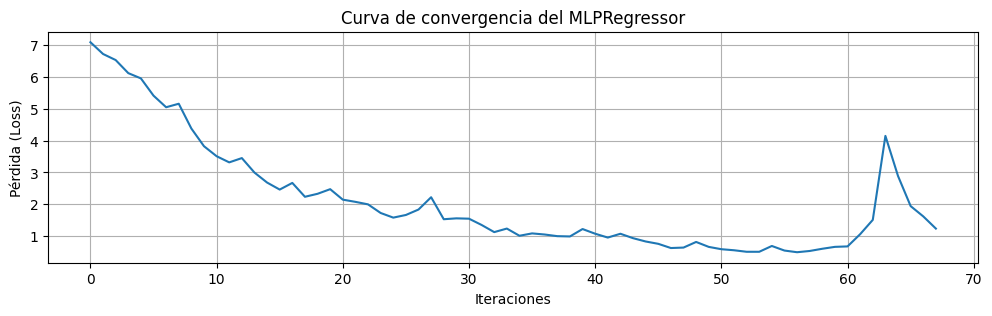

In [16]:


# Graficar la pérdida por iteración
plt.figure(figsize=(12, 3))
plt.plot(best_mlp.loss_curve_)
plt.title("Curva de convergencia del MLPRegressor")
plt.xlabel("Iteraciones")
plt.ylabel("Pérdida (Loss)")
plt.grid(True)
plt.show()

In [17]:
# --- Predicción ---
yPredict = best_mlp.predict(xTestScaled)
print(yPredict[:10])
# --- Predicción ---
yPredictFeature = best_mlp.predict(xFeatureScaler)
#print(yPredict[:10])

[0.18235952 0.33043875 0.11479077 0.01001989 1.95464456 0.19959139
 0.10020212 0.05382778 0.19655364 0.2221448 ]


In [18]:
print('Reporte de datos NaN por columna:')
print(filtered_dataset.isnull().sum())


Reporte de datos NaN por columna:
value                 864
precipitation_1      3504
precipitation_2      3504
precipitation_3      3504
precipitation_4      3504
                     ... 
precipitation_896    3504
precipitation_897    3504
precipitation_898    3504
precipitation_899    3504
precipitation_900    3504
Length: 901, dtype: int64


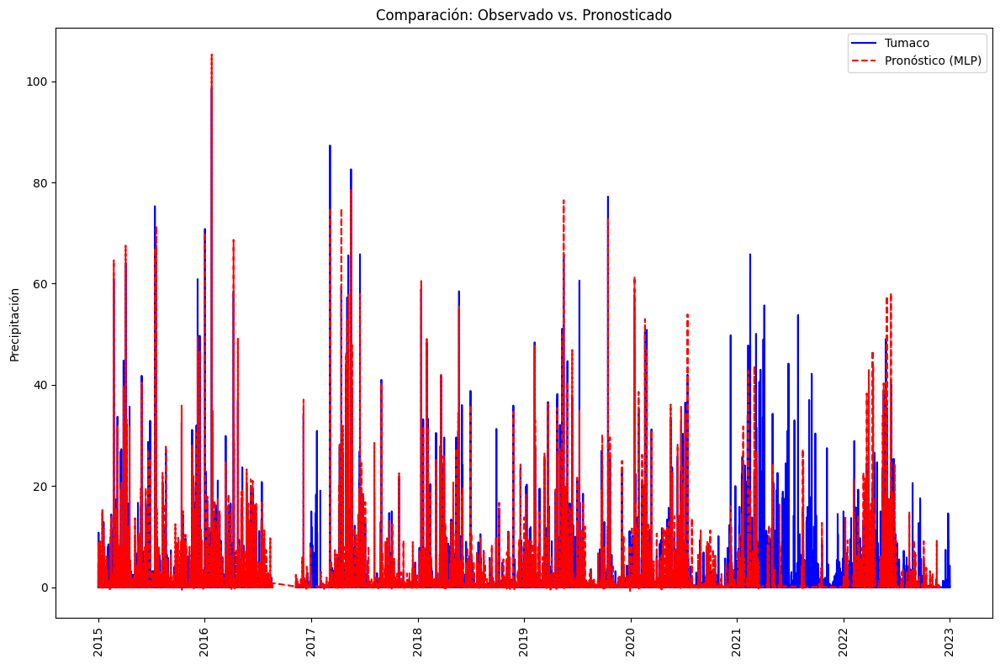

In [19]:
# --- Visualización de comparación ---
fig, ax = plt.subplots(figsize=(12, 8), sharex=True, sharey=True)
ax.plot(filtered_dataset.index, filtered_dataset['value'], label="Tumaco", color="blue")
#ax.plot(filtered_dataset.index, filtered_dataset['value'], label='Observado (Tumaco)', color='blue')
ax.plot(xFeatures.index, yPredictFeature, label='Pronóstico (MLP)', color='red', linestyle='--')
ax.set_title('Comparación: Observado vs. Pronosticado')
ax.set_ylabel('Precipitación')
ax.legend()
plt.xticks(rotation='vertical')
plt.tight_layout()
plt.show()

In [20]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

print("MAE:", mean_absolute_error(filtered_dataset.loc[xTest.index, 'value'], yPredict))
print("RMSE:", np.sqrt(mean_squared_error(filtered_dataset.loc[xTest.index, 'value'], yPredict)))
print("R²:", r2_score(filtered_dataset.loc[xTest.index, 'value'], yPredict))


MAE: 1.1540174335543094
RMSE: 3.842526573106516
R²: -0.2534965053629026


C:\Users\drengifo\AppData\Local\Temp\ipykernel_63480\1091080185.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_dataset['imputados'] = np.nan


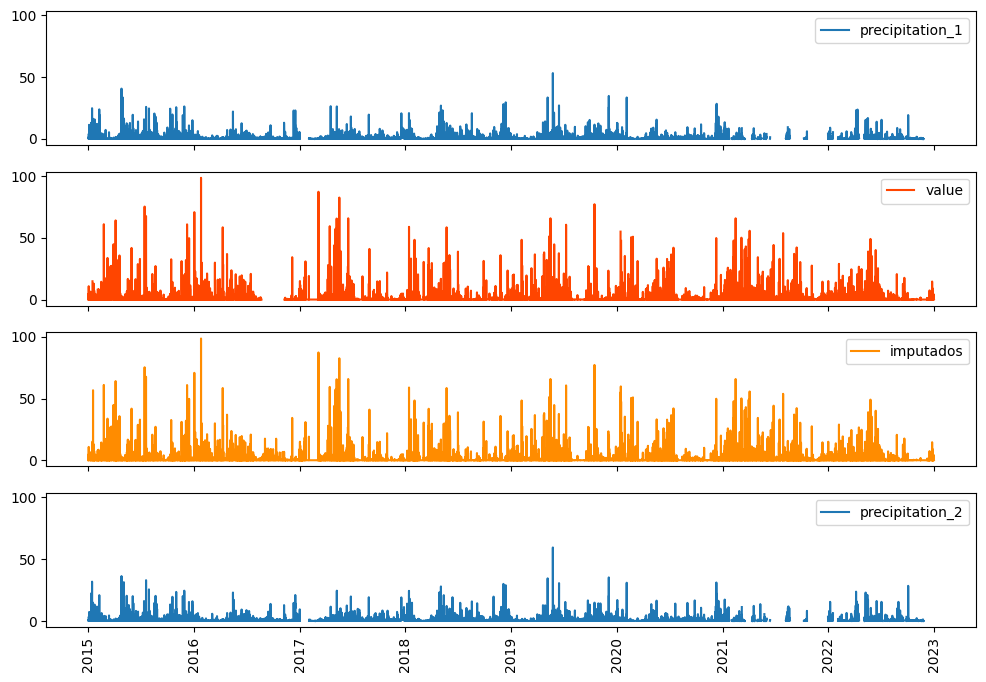

In [21]:
# Crear la nueva columna
filtered_dataset['imputados'] = np.nan

# Crear máscara
missing_mask = (
    filtered_dataset['value'].isna() &
    filtered_dataset[precip_cols].notna().all(axis=1)
)

# Transformar y predecir
to_impute = filtered_dataset.loc[missing_mask, precip_cols]
to_impute_scaled = scaler.transform(to_impute)
predicted_values = best_mlp.predict(to_impute_scaled)
predicted_values = np.where(predicted_values < 0, 0, predicted_values)
filtered_dataset.loc[missing_mask, 'imputados'] = predicted_values

# Copiar los valores originales donde existen
filtered_dataset.loc[filtered_dataset['value'].notna(), 'imputados'] = filtered_dataset['value']

#show original and filled values
fig, axs=plt.subplots(4,1,figsize=(12,8),sharex=True,sharey=True)
axs[0].plot(filtered_dataset.index,filtered_dataset['precipitation_1'],label='precipitation_1')
axs[0].legend()
axs[1].plot(filtered_dataset.index,filtered_dataset['value'],label='value',color='orangered')
axs[1].legend()
axs[2].plot(filtered_dataset.index,filtered_dataset['imputados'],label='imputados',color='darkorange')
axs[2].legend()
axs[3].plot(filtered_dataset.index,filtered_dataset['precipitation_2'],label='precipitation_2')
axs[3].legend()
plt.xticks(rotation='vertical')
plt.show()

In [22]:
# Reporte de NaNs
print('Reporte de datos NaN por columna:')
print(filtered_dataset.isnull().sum())


Reporte de datos NaN por columna:
value                 864
precipitation_1      3504
precipitation_2      3504
precipitation_3      3504
precipitation_4      3504
                     ... 
precipitation_897    3504
precipitation_898    3504
precipitation_899    3504
precipitation_900    3504
imputados               2
Length: 902, dtype: int64


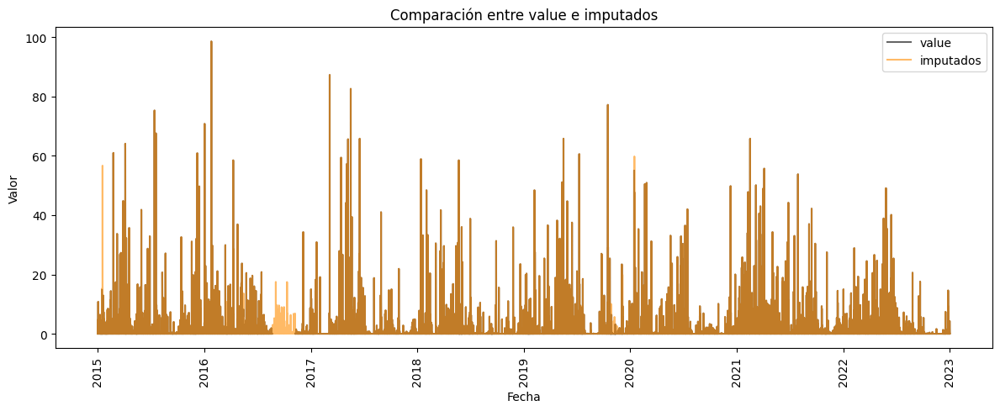

In [23]:
# Mostrar solo 'value' e 'imputados' con transparencia
plt.figure(figsize=(12, 5))
plt.plot(filtered_dataset.index, filtered_dataset['value'], label='value', color='black', alpha=0.6)
plt.plot(filtered_dataset.index, filtered_dataset['imputados'], label='imputados', color='darkorange', alpha=0.6)
plt.legend()
plt.xticks(rotation='vertical')
plt.title('Comparación entre value e imputados')
plt.xlabel('Fecha')
plt.ylabel('Valor')
plt.tight_layout()
plt.show()


In [24]:
from graphics_utils.go import multi_line

fig=multi_line(original=filtered_dataset['value'], imputada=filtered_dataset['imputados'])
fig.show()

In [25]:
from statsmodels.tsa.seasonal import seasonal_decompose
import pandas as pd
import plotly.graph_objects as go

# 1. Selección de la columna
precip_clean = filtered_dataset['imputados'].copy()

# 2. Conversión del índice a datetime
precip_clean.index = pd.to_datetime(precip_clean.index)

# 3. Reindexar con frecuencia completa
full_index = pd.date_range(start=precip_clean.index.min(), end=precip_clean.index.max(), freq='3h')
precip_clean = precip_clean.reindex(full_index)

# 4. Interpolación para NaNs
precip_clean = precip_clean.interpolate(method='linear')

# 5. Verificar valores nulos
print("¿Valores nulos restantes?", precip_clean.isna().sum())

# 6. Descomposición
decomposition = seasonal_decompose(precip_clean, model='additive', two_sided=True,period=8*28*18)

# 7. Visualización con Plotly
fig = go.Figure()

fig.add_trace(go.Scatter(x=precip_clean.index, y=decomposition.observed, name='Observed'))
fig.add_trace(go.Scatter(x=precip_clean.index, y=decomposition.trend, name='Trend'))
fig.add_trace(go.Scatter(x=precip_clean.index, y=decomposition.seasonal, name='Seasonal'))
fig.add_trace(go.Scatter(x=precip_clean.index, y=decomposition.resid, name='Residual'))

fig.update_layout(
    title='Descomposición Temporal - Precipitación (Plotly)',
    xaxis_title='Fecha',
    yaxis_title='Valor',
    height=600,
    legend_title='Componentes',
    template='plotly_white'
)

fig.show()


¿Valores nulos restantes? 0


- **Prophet** (Facebook)

1. Preparación de los datos con Prophet

In [26]:
import pandas as pd
from prophet import Prophet
import matplotlib.pyplot as plt

# Suponiendo que 'precipNotNan' es tu DataFrame con la columna 'value' y un índice de tiempo
df_prophet = pd.DataFrame({
    'ds': filtered_dataset.index,  # Fechas (debe ser datetime)
    'y': filtered_dataset['value']  # Valores (con NaN)
})

# Identificar los valores faltantes
mask_nan = df_prophet['y'].isnull()

2. Entrenar el modelo Prophet

In [27]:
# Configurar y entrenar el modelo (ajusta seasonality_mode según tus datos)
model_prophet = Prophet(
    seasonality_mode='multiplicative',  # 'additive' o 'multiplicative'
    yearly_seasonality=False,           # Habilitar estacionalidad anual
    daily_seasonality=True,           # Deshabilitar si no hay datos diarios
    weekly_seasonality=True           # Deshabilitar si no es relevante
)
model_prophet.fit(df_prophet[~mask_nan])  # Entrenar solo con datos no NaN

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:Adding TBB (e:\074-Diego Rengifo 2025\datasience\precipitacion\bigdata\bigdata\Lib\site-packages\prophet\stan_model\cmdstan-2.33.1\stan\lib\stan_math\lib\tbb) to PATH
DEBUG:cmdstanpy:input tempfile: C:\Users\drengifo\AppData\Local\Temp\tmpklsytil6\qxyyij5o.json
DEBUG:cmdstanpy:input tempfile: C:\Users\drengifo\AppData\Local\Temp\tmpklsytil6\qmc1ghfy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['E:\\074-Diego Rengifo 2025\\datasience\\precipitacion\\bigdata\\bigdata\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=2427', 'data', 'file=C:\\Users\\drengifo\\AppData\\Local\\Temp\\tmpklsytil6\\qxyyij5o.json', 'init=C:\\Users\\drengifo\\AppData\\Local\\Temp\\tmpklsytil6\\qmc1ghfy.json', 'output', 'file=C:\\Users\\drengifo\\AppData\\Local\\Temp\\tmpklsytil6\\prophet_model0iwnd25v\\prophet_model-20250622224045.csv', 'method=optimize', 'al

3. Generar predicciones (incluyendo los puntos con NaN)

In [28]:
# Crear un DataFrame con todas las fechas (originales)
future = model_prophet.make_future_dataframe(periods=0)  # No agregar fechas futuras

# Predecir valores (incluyendo los NaN)
forecast = model_prophet.predict(future)
df_prophet['y_imputed'] = forecast['yhat']  # Columna con predicciones

# Combinar: mantener valores originales donde existan, reemplazar NaN con predicciones
df_prophet['y_combined'] = df_prophet['y'].fillna(df_prophet['y_imputed'])

4. Graficar datos originales vs. imputados

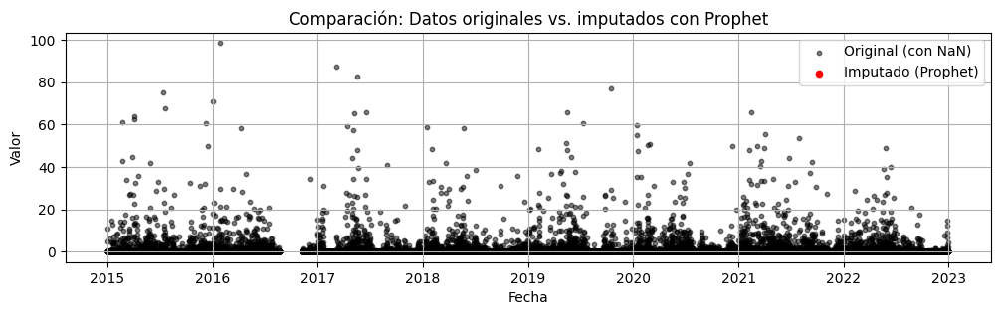

In [29]:
plt.figure(figsize=(12, 3))

# Datos originales (con NaN)
plt.scatter(
    df_prophet['ds'], 
    df_prophet['y'], 
    color='black', 
    label='Original (con NaN)', 
    alpha=0.5,
    s=10
)

# Datos imputados (solo donde había NaN)
plt.scatter(
    df_prophet.loc[mask_nan, 'ds'], 
    df_prophet.loc[mask_nan, 'y_combined'], 
    color='red', 
    label='Imputado (Prophet)', 
    s=20
)

plt.title('Comparación: Datos originales vs. imputados con Prophet')
plt.xlabel('Fecha')
plt.ylabel('Valor')
plt.legend()
plt.grid(True)
plt.show()

- **XGBoost/LightGBM** con Features Temporales

In [30]:
'''import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV, TimeSeriesSplit
from scipy.stats import randint, uniform
from sklearn.metrics import mean_squared_error

# 1. Preparación de datos
data = filtered_dataset.sort_index().copy()
mask = data['value'].isnull()

# Solo definimos data_not_null para el entrenamiento
data_not_null = data[~mask].copy()

# 2. Definir características y target
feature_cols = precip_cols  # Asegúrate que es una lista de columnas existentes
X = data_not_null[feature_cols]
y = data_not_null['value']

# 3. División temporal (80-20)
split_idx = int(len(data_not_null) * 0.8)
X_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]
y_train, y_test = y.iloc[:split_idx], y.iloc[split_idx:]

# 4. Configuración de la búsqueda aleatoria
param_dist = {
    'n_estimators': randint(100, 500),
    'max_depth': randint(3, 8),
    'learning_rate': uniform(0.01, 0.2),
    'subsample': uniform(0.7, 0.3),
    'colsample_bytree': uniform(0.7, 0.3),
    'gamma': uniform(0, 0.3),
    'reg_alpha': uniform(0, 0.5),
    'reg_lambda': uniform(0.5, 1.5)
}

tscv = TimeSeriesSplit(n_splits=5)

# 5. Búsqueda de hiperparámetros
random_search = RandomizedSearchCV(
    estimator=XGBRegressor(objective='reg:squarederror', n_jobs=-1, random_state=42),
    param_distributions=param_dist,
    n_iter=30,
    scoring='neg_root_mean_squared_error',
    cv=tscv,
    verbose=2,
    random_state=42,
    n_jobs=-1
)

random_search.fit(X_train, y_train)
best_model = random_search.best_estimator_

# 6. Entrenamiento final con evaluación
final_model = XGBRegressor(**random_search.best_params_)
eval_set = [(X_train, y_train), (X_test, y_test)]
final_model.fit(X_train, y_train, eval_set=eval_set, verbose=True)

# 7. Evaluación del modelo
test_preds = final_model.predict(X_test)
test_rmse = np.sqrt(mean_squared_error(y_test, test_preds))
print(f"RMSE en test set: {test_rmse:.4f}")

# 8. Imputación de valores faltantes (solo si hay valores nulos)
if mask.any():  # Verifica si hay valores nulos
    # Creamos data_null solo cuando sea necesario
    data_null = data[mask].copy()
    X_null = data_null[feature_cols]
    imputed_values = final_model.predict(X_null)
    data.loc[mask, 'value'] = imputed_values

# 9. Gráfico de resultados (opcional)
plt.figure(figsize=(10, 6))
plt.plot(y_test.index, y_test, 'b-', label='Valores Reales')
plt.plot(y_test.index, test_preds, 'r--', label='Predicciones', alpha=0.7)
plt.title('Predicciones vs Valores Reales (Test Set)')
plt.xlabel('Fecha')
plt.ylabel('Valor')
plt.legend()
plt.grid()
plt.show()'''

'import pandas as pd\nimport numpy as np\nimport matplotlib.pyplot as plt\nfrom xgboost import XGBRegressor\nfrom sklearn.model_selection import RandomizedSearchCV, TimeSeriesSplit\nfrom scipy.stats import randint, uniform\nfrom sklearn.metrics import mean_squared_error\n\n# 1. Preparación de datos\ndata = filtered_dataset.sort_index().copy()\nmask = data[\'value\'].isnull()\n\n# Solo definimos data_not_null para el entrenamiento\ndata_not_null = data[~mask].copy()\n\n# 2. Definir características y target\nfeature_cols = precip_cols  # Asegúrate que es una lista de columnas existentes\nX = data_not_null[feature_cols]\ny = data_not_null[\'value\']\n\n# 3. División temporal (80-20)\nsplit_idx = int(len(data_not_null) * 0.8)\nX_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]\ny_train, y_test = y.iloc[:split_idx], y.iloc[split_idx:]\n\n# 4. Configuración de la búsqueda aleatoria\nparam_dist = {\n    \'n_estimators\': randint(100, 500),\n    \'max_depth\': randint(3, 8),\n    \'learn

[0]	validation_0-rmse:3.32867
[1]	validation_0-rmse:3.22496
[2]	validation_0-rmse:3.11762
[3]	validation_0-rmse:3.02164
[4]	validation_0-rmse:2.91421
[5]	validation_0-rmse:2.80858
[6]	validation_0-rmse:2.72460
[7]	validation_0-rmse:2.64463
[8]	validation_0-rmse:2.56226
[9]	validation_0-rmse:2.48306
[10]	validation_0-rmse:2.39860
[11]	validation_0-rmse:2.31995
[12]	validation_0-rmse:2.25274
[13]	validation_0-rmse:2.18686
[14]	validation_0-rmse:2.11593
[15]	validation_0-rmse:2.04379
[16]	validation_0-rmse:1.98513
[17]	validation_0-rmse:1.92465
[18]	validation_0-rmse:1.85583
[19]	validation_0-rmse:1.79845
[20]	validation_0-rmse:1.75373
[21]	validation_0-rmse:1.70548
[22]	validation_0-rmse:1.65431
[23]	validation_0-rmse:1.60697
[24]	validation_0-rmse:1.55897
[25]	validation_0-rmse:1.50961
[26]	validation_0-rmse:1.46283
[27]	validation_0-rmse:1.42212
[28]	validation_0-rmse:1.38024
[29]	validation_0-rmse:1.33709
[30]	validation_0-rmse:1.30371
[31]	validation_0-rmse:1.26913
[32]	validation_0-

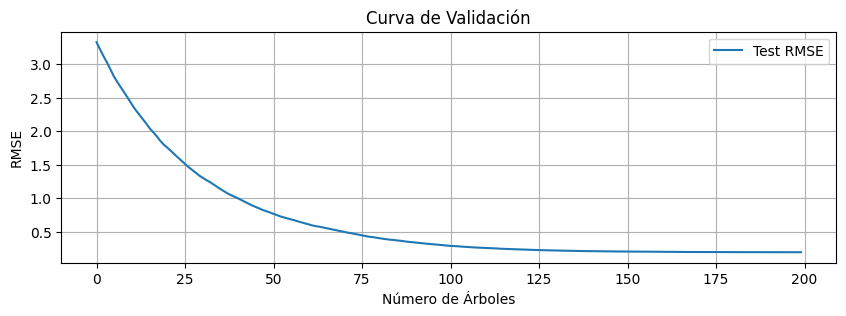

In [31]:
import pandas as pd
import numpy as np
from xgboost import XGBRegressor

# 1. Copiar datos y crear máscara
data = filtered_dataset.sort_index().copy()
mask = data['value'].isnull()
data_not_null = data[~mask].copy()  # Datos sin NaN
data_null = data[mask].copy()       # Datos con NaN

# 2. Definir características (X) y variable objetivo (y)
# ---> Asegúrate de que 'precip_cols' sea una LISTA de nombres de columnas <---
feature_cols = precip_cols  # Ejemplo: ['precip1', 'precip2', 'temp']
xTrain = data_not_null[feature_cols]  # Características de entrenamiento
yTrain = data_not_null['value']       # Variable objetivo

# 3. Entrenar modelo
model = XGBRegressor(
    n_estimators=200,
    learning_rate=0.05,
    max_depth=24,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_alpha=0.1,
    reg_lambda=1.0,
    gamma=0.5,
    objective='reg:squarederror',
    eval_metric='rmse',
    early_stopping_rounds=50,  # ¡Ahora va aquí!
    random_state=42,
    n_jobs=-1
)

# 3. Entrenar con validación
model.fit(
    xTrain, yTrain,
    eval_set=[(xTest, yTest)],  # Solo evaluación en test
    #verbose=True
)

# 4. Graficar resultados
results = model.evals_result()
plt.figure(figsize=(10, 3))
plt.plot(results['validation_0']['rmse'], label='Test RMSE')
plt.xlabel('Número de Árboles')
plt.ylabel('RMSE')
plt.title('Curva de Validación')
plt.legend()
plt.grid()
plt.show()


In [32]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Predicciones
y_train_pred = model.predict(xTrain)
y_val_pred = model.predict(xTest)

# Métricas
train_rmse = np.sqrt(mean_squared_error(yTrain, y_train_pred))
val_rmse = np.sqrt(mean_squared_error(yTest, y_val_pred))
train_r2 = r2_score(yTrain, y_train_pred)
val_r2 = r2_score(yTest, y_val_pred)

print(f"Train RMSE: {train_rmse:.4f}, R2: {train_r2:.4f}")
print(f"Validation RMSE: {val_rmse:.4f}, R2: {val_r2:.4f}")

Train RMSE: 1.3681, R2: 0.8799
Validation RMSE: 0.1911, R2: 0.9969


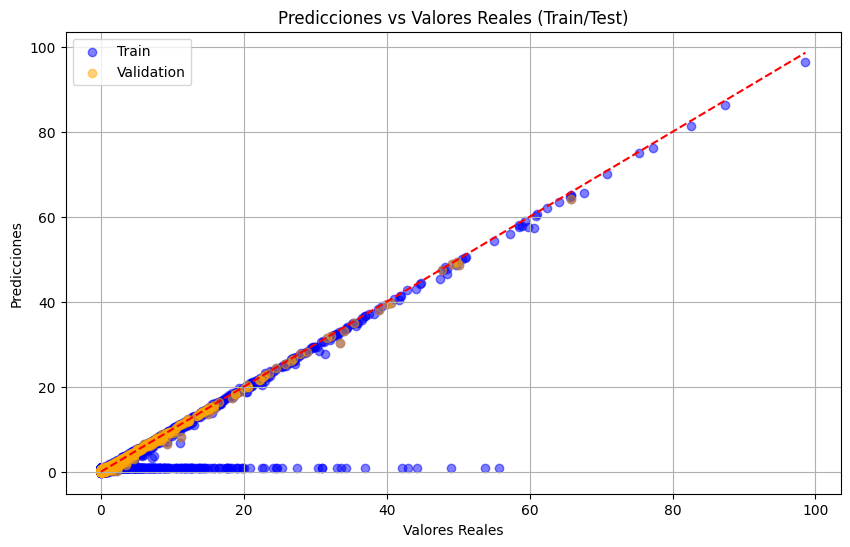

In [33]:
plt.figure(figsize=(10, 6))
plt.scatter(yTrain, y_train_pred, alpha=0.5, label='Train', color='blue')
plt.scatter(yTest, y_val_pred, alpha=0.5, label='Validation', color='orange')
plt.plot([min(yTrain), max(yTrain)], [min(yTrain), max(yTrain)], '--r')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.title('Predicciones vs Valores Reales (Train/Test)')
plt.legend()
plt.grid()
plt.show()

<Figure size 1200x300 with 0 Axes>

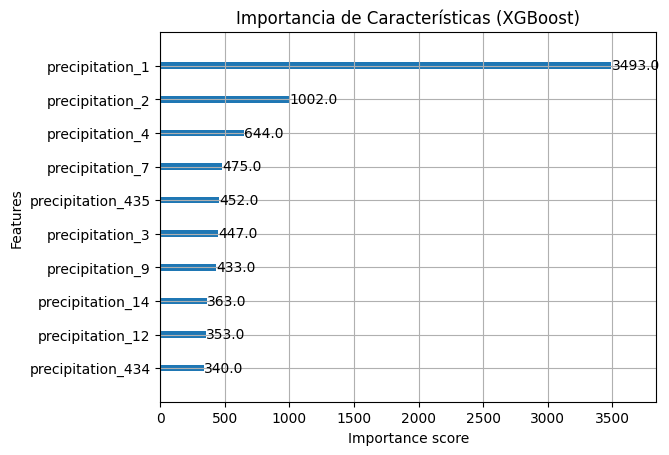

In [34]:
from xgboost import plot_importance

plt.figure(figsize=(12, 3))
plot_importance(model, max_num_features=10)  # Top 10 características
plt.title('Importancia de Características (XGBoost)')
plt.show()

In [35]:

# 4. Predecir valores faltantes
if not data_null.empty:
    X_null = data_null[feature_cols]  # Usa la lista de columnas, no un DataFrame
    imputed_values = model.predict(X_null)  # Corregido: usa X_null, no xFeatures
    
    # Asignar valores imputados
    data.loc[mask, 'value'] = imputed_values

# Resultado
#print(data.head())

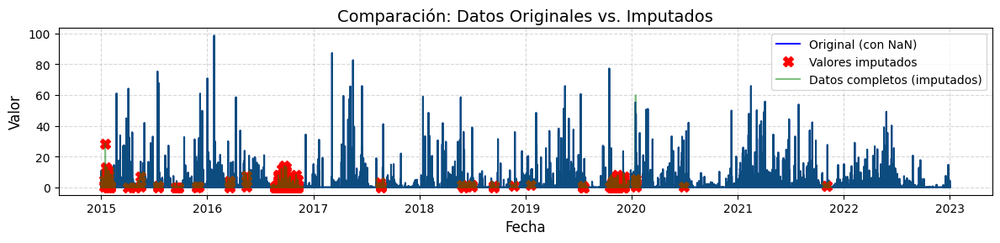

In [36]:
import matplotlib.pyplot as plt

# 1. Crear figura
plt.figure(figsize=(12, 3))

# 2. Graficar datos originales (incluyendo NaN)
plt.plot(data.index, filtered_dataset['value'], 
         '', color='blue', label='Original (con NaN)', alpha=0.9)

# 3. Graficar datos imputados (solo donde había NaN)
plt.plot(data.index[mask], data['value'][mask], 
         'X', color='red', markersize=8, label='Valores imputados')

# 4. Graficar datos completos (sin NaN)
plt.plot(data.index, data['value'], 
         '-', color='green', label='Datos completos (imputados)', alpha=0.5)

# 5. Personalizar gráfico
plt.title('Comparación: Datos Originales vs. Imputados', fontsize=14)
plt.xlabel('Fecha', fontsize=12)
plt.ylabel('Valor', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()

# 6. Mostrar gráfico
plt.show()

In [ ]:
import plotly.express as px

fig = px.line(data, x=data.index, y='value', 
              title='Datos Originales vs. Imputados')
fig.add_scatter(x=data.index[mask], y=data['value'][mask], 
               mode='markers', name='Imputados', marker_color='red')
fig.show()

- **Redes Neuronales** (LSTM, CNN-1D)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
model = Sequential([
    LSTM(50, input_shape=(n_steps, n_features)),
    Dense(1)
])
model.compile(optimizer='adam', loss='mse')

ModuleNotFoundError: No module named 'tensorflow'


- Modelos de regresión multivariable (MLR).




#### 📌 4.2.3 Técnicas de Imputación de Datos Faltantes
- Interpolación Temporal

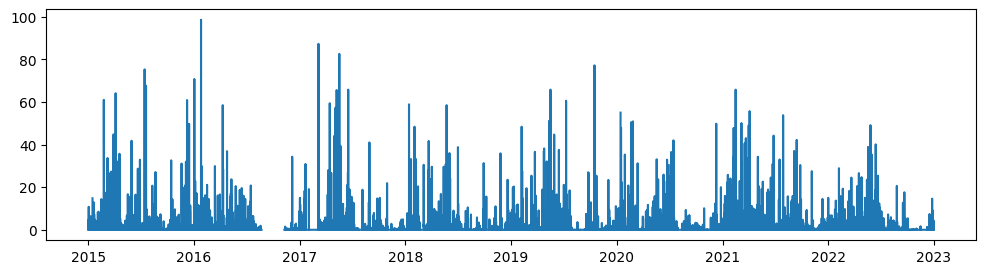

In [ ]:
filtered_dataset_it=filtered_dataset.copy()
filtered_dataset_it['value'].interpolate(method='time')

plt.figure(figsize=(12, 3))
plt.plot(filtered_dataset_it['value'])

- KNN Imputer

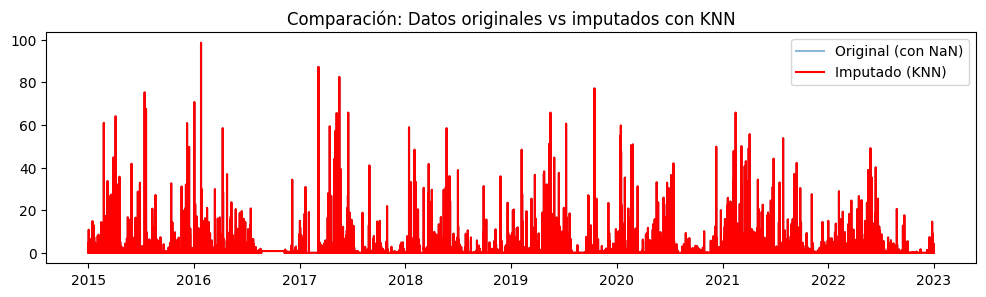

In [ ]:
import matplotlib.pyplot as plt
from sklearn.impute import KNNImputer

# 1. Copia del dataset y selección de la columna a imputar
filtered_dataset_iknn = filtered_dataset.copy()
column_to_impute = filtered_dataset_iknn[['value']]  # DataFrame 2D (necesario para KNNImputer)

# 2. Configuración del imputador (ajusta n_neighbors según tu dataset)
n_neighbors = 5  # Ejemplo: usa 5 vecinos (ajústalo según tus necesidades)
imputer = KNNImputer(n_neighbors=n_neighbors)

# 3. Imputación
X_imputed_knn = imputer.fit_transform(column_to_impute)  # Devuelve un array NumPy 2D

# 4. Convertir el resultado a Series de pandas (para graficar y comparar)
imputed_series = pd.Series(X_imputed_knn.flatten(), index=filtered_dataset_iknn.index)

# 5. Visualización
plt.figure(figsize=(12, 3))
plt.plot(filtered_dataset_iknn['value'], label='Original (con NaN)', alpha=0.5)
plt.plot(imputed_series, label='Imputado (KNN)', color='red')
plt.legend()
plt.title('Comparación: Datos originales vs imputados con KNN')
plt.show()


- Iterative Imputer


In [ ]:
from sklearn.experimental import enable_iterative_imputer  # Necesario para importar
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor

# Configurar el imputador con RandomForest como estimador
imputer = IterativeImputer(
    estimator=RandomForestRegressor(),  # Modelo para predecir NaN
    max_iter=10,                       # Número de iteraciones
    random_state=42,
    verbose=2                          # Mostrar progreso
)

# Aplicar imputación
X_imputed = imputer.fit_transform(filtered_dataset['value'])

# Convertir a DataFrame
X_imputed = pd.DataFrame(X_imputed, columns=filtered_dataset['value'])
X_imputed

ValueError: Expected a 2-dimensional container but got <class 'pandas.core.series.Series'> instead. Pass a DataFrame containing a single row (i.e. single sample) or a single column (i.e. single feature) instead.

C:\Users\drengifo\AppData\Local\Temp\ipykernel_75244\2516617443.py:51: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\drengifo\AppData\Local\Temp\ipykernel_75244\2516617443.py:58: UserWarning:

The figure layout has changed to tight



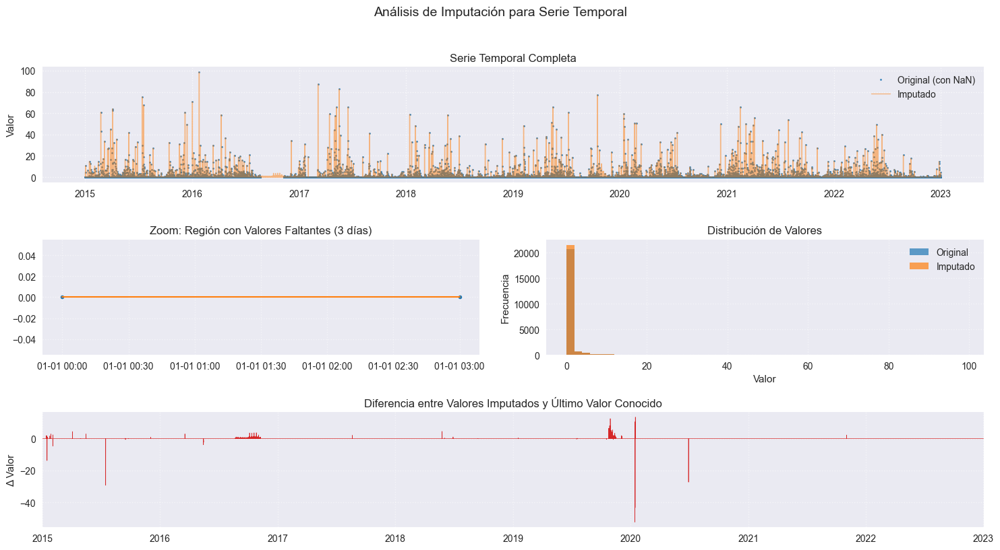

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.gridspec import GridSpec

# Configuración del estilo
plt.style.use('seaborn-v0_8')
plt.rcParams['figure.figsize'] = [15, 8]
plt.rcParams['font.size'] = 12

# Crear figura con subgráficos
fig = plt.figure(constrained_layout=True)
gs = GridSpec(3, 2, figure=fig)

# Gráfico 1: Serie temporal completa
ax1 = fig.add_subplot(gs[0, :])
ax1.plot(filtered_dataset.index, filtered_dataset['value'], 
         'o', markersize=2, color='#1f77b4', alpha=0.9, label='Original (con NaN)')
ax1.plot(filtered_dataset_imputed.index, filtered_dataset_imputed['value'], 
         '-', linewidth=1, color='#ff7f0e', alpha=0.5,  label='Imputado')
ax1.set_title('Serie Temporal Completa')
ax1.set_ylabel('Valor')
ax1.legend()
ax1.grid(True, linestyle=':', alpha=0.7)

# Gráfico 2: Zoom en sección con NaN (ejemplo de 3 días)
sample_window = filtered_dataset.loc['2023-01-01':'2023-01-03']  # Ajusta estas fechas
ax2 = fig.add_subplot(gs[1, 0])
ax2.plot(sample_window.index, sample_window['value'], 
         'o', markersize=4, color='#1f77b4', label='Original')
ax2.plot(filtered_dataset_imputed.loc[sample_window.index].index, 
         filtered_dataset_imputed.loc[sample_window.index]['value'],
         '-', linewidth=1.5, color='#ff7f0e', label='Imputado')
ax2.set_title('Zoom: Región con Valores Faltantes (3 días)')
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m %H:%M'))
ax2.grid(True, linestyle=':', alpha=0.5)

# Gráfico 3: Distribución de valores
ax3 = fig.add_subplot(gs[1, 1])
ax3.hist(filtered_dataset['value'].dropna(), bins=50, 
         color='#1f77b4', alpha=0.7, label='Original')
ax3.hist(filtered_dataset_imputed['value'], bins=50, 
         color='#ff7f0e', alpha=0.7, label='Imputado')
ax3.set_title('Distribución de Valores')
ax3.set_xlabel('Valor')
ax3.set_ylabel('Frecuencia')
ax3.legend()
ax3.grid(True, linestyle=':', alpha=0.5)

# Gráfico 4: Cambios puntuales
ax4 = fig.add_subplot(gs[2, :])
changes = filtered_dataset_imputed['value'] - filtered_dataset['value'].fillna(method='ffill')
changes.plot(ax=ax4, color='#d62728', linewidth=0.5)
ax4.set_title('Diferencia entre Valores Imputados y Último Valor Conocido')
ax4.set_ylabel('Δ Valor')
ax4.grid(True, linestyle=':', alpha=0.5)

plt.suptitle('Análisis de Imputación para Serie Temporal', y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:
'''import pandas as pd
import numpy as np
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor
from tqdm import tqdm
import gc  # Para gestión de memoria

def optimized_temporal_imputation(df, target_col='value', chunk_size=100000):
    # 1. Crear características temporales
    df = df.copy()
    df['hour'] = df.index.hour
    df['day_of_week'] = df.index.dayofweek
    df['month'] = df.index.month
    df['time_ordinal'] = (df.index - df.index[0]).total_seconds()
    
    # 2. Columnas a usar
    features = [target_col, 'hour', 'day_of_week', 'month', 'time_ordinal']
    all_imputed = np.empty(len(df)) * np.nan
    
    # 3. Configurar imputador GLOBAL
    imputer = IterativeImputer(
        estimator=RandomForestRegressor(
            n_estimators=500,
            max_depth=100,
            max_samples=0.3,
            n_jobs=-1,
            random_state=42
        ),
        max_iter=5,
        tol=1e-2,
        random_state=42,
        verbose=0
    )
    
    # 4. Entrenamiento inicial con muestra representativa
    sample_size = min(500000, len(df) // 10)
    train_sample = df.dropna().sample(sample_size, random_state=42)[features]
    imputer.fit(train_sample)
    del train_sample
    gc.collect()
    
    # 5. Imputación por chunks con ventana solapada
    chunks = range(0, len(df), chunk_size)
    window_overlap = 5000  # Mantener contexto temporal entre chunks
    
    for i in tqdm(range(len(chunks))):
        start = max(0, i * chunk_size - window_overlap)
        end = min(len(df), (i+1) * chunk_size + window_overlap)
        
        chunk_data = df.iloc[start:end][features].copy()
        
        # Transform (no fit!) usando el modelo global
        imputed_chunk = imputer.transform(chunk_data)
        
        # Extraer parte central sin solapamiento
        chunk_start = window_overlap if start > 0 else 0
        chunk_end = -window_overlap if end < len(df) else None
        valid_chunk = imputed_chunk[chunk_start:chunk_end, 0]
        
        # Almacenar resultados
        chunk_start_idx = i * chunk_size
        chunk_end_idx = min((i+1) * chunk_size, len(df))
        all_imputed[chunk_start_idx:chunk_end_idx] = valid_chunk
        
        # Liberar memoria
        del chunk_data, imputed_chunk
        gc.collect()
    
    # 6. Construir resultado final
    result = df.copy()
    result[target_col] = all_imputed
    return result[['value']]  # Devolver solo la columna imputada

# Aplicar al dataset
filtered_dataset_imputed = optimized_temporal_imputation(
    filtered_dataset,
    chunk_size=200000  # Ajustar según RAM disponible
)'''

In [ ]:
plt.figure(figsize=(12,3))
plt.plot(X_imputed)

#### 4.2. Ensembles

- Random Forest para variables con relaciones no lineales.
    
    Robustez a outliers, maneja relaciones no lineales



- La técnica aplicada se documenta en la columna dp, permitiendo rastrear el origen de cada dato imputado.



## 5. Estándares y Buenas Prácticas
- Trazabilidad: Toda modificación o imputación debe estar documentada y trazable.

- Conservación de Datos Originales: Mantener una copia sin modificar de la serie original.

- Reproducibilidad: Los scripts de calidad deben ser modulares y versionados.

- Evaluación Continua: Los algoritmos de imputación deben ser validados periódicamente frente a nuevas entradas de datos.

```
import pandas as pd

# Serie original
data = {'value': [2.53, 3.0, None, 2.1]}
index = pd.date_range(start='2020-01-01', periods=4, freq='D')
df = pd.DataFrame(data, index=index)

# Estructura de calidad
df['qf'] = [1, 1, 9, 1]  # 9 indica dato faltante
df['dp'] = [22358, 22358, 99999, 22358]
```
7. Resultados Esperados
- Series de precipitación limpias, consistentes, completas y trazables.

- Imputaciones realizadas con soporte técnico y científico.

- Alineación con estándares internacionales (WMO, IODE, etc.).

- Base sólida para análisis hidrometeorológicos, climatológicos o de gestión del recurso hídrico.


In [ ]:
'''#check scaler
print(xTrainScaled.mean(axis=0))
print(xTrainScaled.std(axis=0))'''

'#check scaler\nprint(xTrainScaled.mean(axis=0))\nprint(xTrainScaled.std(axis=0))'

In [ ]:
#grid_search.best_estimator_.predict()

In [ ]:
'''# Ajustar modelo MLPRegressor
regr = MLPRegressor(
    hidden_layer_sizes=(100,),  # Una capa oculta de 100 neuronas
    activation='relu',
    solver='adam',
    alpha=0.0001,
    batch_size='auto',
    learning_rate='constant',
    max_iter=5000,
    random_state=1
).fit(xTrainScaled, yTrain)

# --- Prueba ---
# Seleccionar todas las columnas de precipitación y eliminar filas con NaN
xTest = filtered_iqr_dataset[precip_cols].dropna()
xTestScaled = scaler.transform(xTest.values)

# Mostrar resumen
print(xTest.describe())
print(xTestScaled[:10])'''

"# Ajustar modelo MLPRegressor\nregr = MLPRegressor(\n    hidden_layer_sizes=(100,),  # Una capa oculta de 100 neuronas\n    activation='relu',\n    solver='adam',\n    alpha=0.0001,\n    batch_size='auto',\n    learning_rate='constant',\n    max_iter=5000,\n    random_state=1\n).fit(xTrainScaled, yTrain)\n\n# --- Prueba ---\n# Seleccionar todas las columnas de precipitación y eliminar filas con NaN\nxTest = filtered_iqr_dataset[precip_cols].dropna()\nxTestScaled = scaler.transform(xTest.values)\n\n# Mostrar resumen\nprint(xTest.describe())\nprint(xTestScaled[:10])"

In [ ]:
'''import matplotlib.pyplot as plt

# Graficar la pérdida por iteración
plt.figure(figsize=(10, 6))
plt.plot(regr.loss_curve_)
plt.title("Curva de convergencia del MLPRegressor")
plt.xlabel("Iteraciones")
plt.ylabel("Pérdida (Loss)")
plt.grid(True)
plt.show()'''

'import matplotlib.pyplot as plt\n\n# Graficar la pérdida por iteración\nplt.figure(figsize=(10, 6))\nplt.plot(regr.loss_curve_)\nplt.title("Curva de convergencia del MLPRegressor")\nplt.xlabel("Iteraciones")\nplt.ylabel("Pérdida (Loss)")\nplt.grid(True)\nplt.show()'

In [ ]:
'''from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import pandas as pd


def train_and_evaluate_model(df, target_column, test_size=0.2, hidden_layers=(100,), max_iter=5000, random_state=42):
    """
    Entrena y evalúa un modelo MLPRegressor sobre un DataFrame dado.

    Args:
        df (pd.DataFrame): DataFrame con las variables.
        target_column (str): Nombre de la columna objetivo.
        test_size (float): Proporción para conjunto de prueba.
        hidden_layers (tuple): Estructura de capas ocultas.
        max_iter (int): Número máximo de iteraciones.
        random_state (int): Semilla para replicabilidad.

    Returns:
        dict: Métricas del modelo.
        object: Modelo entrenado.
        np.ndarray: Predicciones sobre conjunto de prueba.
        pd.DataFrame: Conjunto de prueba con predicciones añadidas.
    """
    
    # Eliminar filas con NaN
    df_clean = df.dropna()
    
    # Separar variables independientes y dependiente
    X = df_clean.drop(columns=[target_column])
    y = df_clean[target_column].values.flatten()

    # División en train y test
    xTrain, xTest, yTrain, yTest = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Escalar datos
    scaler = StandardScaler().fit(xTrain)
    xTrainScaled = scaler.transform(xTrain)
    xTestScaled = scaler.transform(xTest)

    # Crear y entrenar modelo
    regr = MLPRegressor(
        hidden_layer_sizes=hidden_layers,
        activation='relu',
        solver='adam',
        alpha=0.0001,
        max_iter=max_iter,
        random_state=random_state
    )
    regr.fit(xTrainScaled, yTrain)

    # Predicción
    yPred = regr.predict(xTestScaled)

    # Métricas
    metrics = {
        "MAE": mean_absolute_error(yTest, yPred),
        "MSE": mean_squared_error(yTest, yPred),
        "RMSE": mean_squared_error(yTest, yPred, squared=False),
        "R2": r2_score(yTest, yPred)
    }

    # Crear DataFrame con predicciones para análisis posterior
    results_df = xTest.copy()
    results_df[target_column] = yTest
    results_df["predicted_" + target_column] = yPred

    return metrics, regr, yPred, results_df
'''


'from sklearn.model_selection import train_test_split\nfrom sklearn.preprocessing import StandardScaler\nfrom sklearn.neural_network import MLPRegressor\nfrom sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score\nimport numpy as np\nimport pandas as pd\n\n\ndef train_and_evaluate_model(df, target_column, test_size=0.2, hidden_layers=(100,), max_iter=5000, random_state=42):\n    """\n    Entrena y evalúa un modelo MLPRegressor sobre un DataFrame dado.\n\n    Args:\n        df (pd.DataFrame): DataFrame con las variables.\n        target_column (str): Nombre de la columna objetivo.\n        test_size (float): Proporción para conjunto de prueba.\n        hidden_layers (tuple): Estructura de capas ocultas.\n        max_iter (int): Número máximo de iteraciones.\n        random_state (int): Semilla para replicabilidad.\n\n    Returns:\n        dict: Métricas del modelo.\n        object: Modelo entrenado.\n        np.ndarray: Predicciones sobre conjunto de prueba.\n        

In [ ]:
'''from sklearn.model_selection import cross_val_score, TimeSeriesSplit
from sklearn.metrics import make_scorer, mean_squared_error


# 3. Crear scorer para MSE (negativo)
mse_scorer = make_scorer(mean_squared_error, greater_is_better=False)

# 4. Validación cruzada temporal CON PIPELINE
scores = cross_val_score(
    estimator=pipeline,  # Pipeline completo
    X=xTrain,           # Datos sin escalar
    y=yTrain,
    scoring=mse_scorer,
    cv=cv,
    n_jobs=1            # Sin paralelización para mantener orden
)

# 5. Resultados (convertir a positivo)
print("🔍 Resultados Validación Cruzada Temporal:")
print("MSE por fold:", -scores)
print(f"MSE promedio: {-scores.mean():.4f} ± {scores.std():.4f}")'''

🔍 Resultados Validación Cruzada Temporal:
MSE por fold: [18.28080871 20.65608487 14.42823447 15.66160457 19.08833314]
MSE promedio: 17.6230 ± 2.2730


- Guardar y reutilizar el modelo (opcional)

In [ ]:
'''import joblib

# Guardar modelo
joblib.dump(regr, 'mlp_model.pkl')
joblib.dump(scaler, 'scaler.pkl')

# Cargar luego
# regr = joblib.load('mlp_model.pkl')
'''

"import joblib\n\n# Guardar modelo\njoblib.dump(regr, 'mlp_model.pkl')\njoblib.dump(scaler, 'scaler.pkl')\n\n# Cargar luego\n# regr = joblib.load('mlp_model.pkl')\n"

In [ ]:
'''x_df = pd.DataFrame(xFeatureScaler)
print("Reporte de datos NaN por columna:")
print(x_df.isnull().sum())'''


'x_df = pd.DataFrame(xFeatureScaler)\nprint("Reporte de datos NaN por columna:")\nprint(x_df.isnull().sum())'